<a href="https://colab.research.google.com/github/sinku247/ms-py-colab/blob/main/PythonCognitiveComputerVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Computer Vision Image analysis

import requests
from io import BytesIO
from PIL import Image

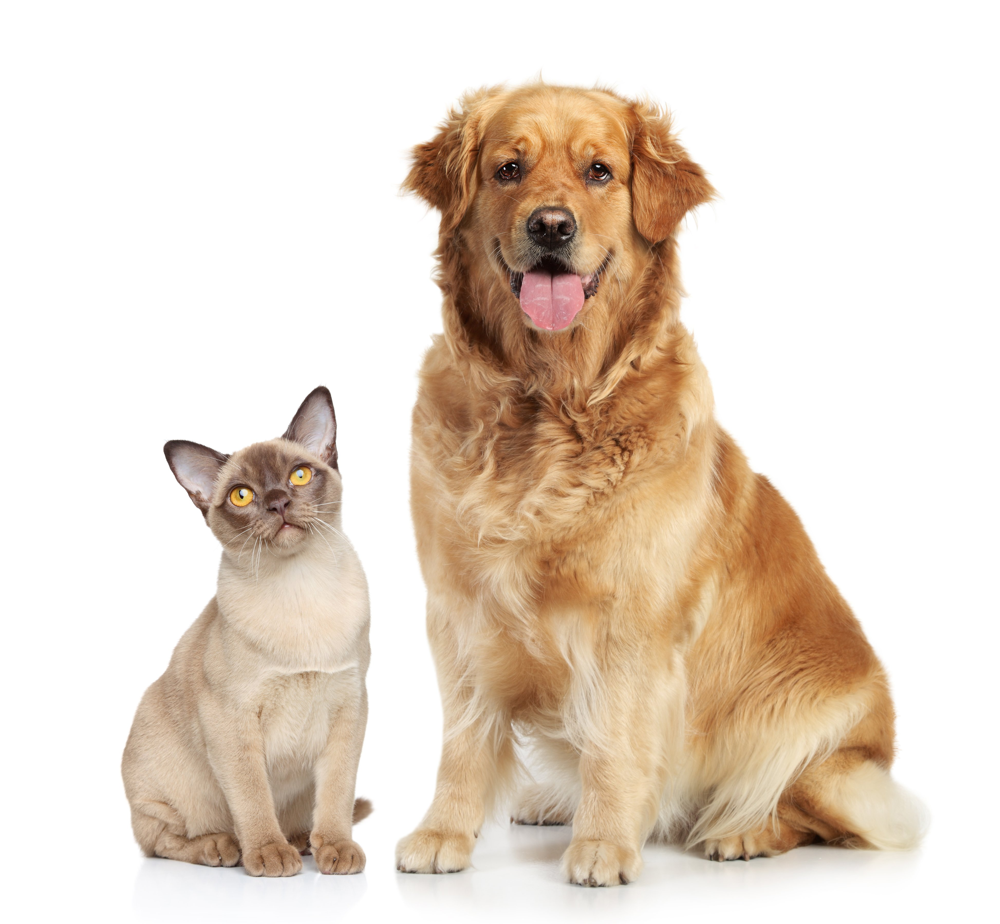

In [ ]:
image_url = 'https://worcestercountyhumanesociety.org/wp-content/uploads/2016/05/cat-and-dog_98962007.jpg'
image = Image.open(BytesIO(requests.get(image_url).content))

# response = requests.get(image_url)
# img = BytesIO(response.content)
# image = Image.open(img)
image


In [3]:
#필요한 값들을 준비한다.
key = '0ba52aa0c08f4d238627826bece1f983'
endpoint='https://labuser63computervision2.cognitiveservices.azure.com/' + 'vision/v2.0/'

In [4]:
analyze_endpoint = endpoint + 'analyze'
detect_endpoint = endpoint + 'detect'

In [5]:
header = {'Ocp-Apim-Subscription-Key': key}
params = {'visualFeatures':'Categories,Description,Color'}
data = {'url':image_url}

In [6]:
response = requests.post(analyze_endpoint, headers=header, params= params, json=data)

In [9]:
result = response.json()
result

{'categories': [{'name': 'animal_dog', 'score': 0.99609375}],
 'color': {'dominantColorForeground': 'White',
  'dominantColorBackground': 'White',
  'dominantColors': ['White'],
  'accentColor': 'AE7F1D',
  'isBwImg': False,
  'isBWImg': False},
 'description': {'tags': ['dog',
   'sitting',
   'brown',
   'animal',
   'looking',
   'standing',
   'tan',
   'cat',
   'front',
   'posing',
   'large',
   'laying'],
  'captions': [{'text': 'a dog looking at the camera',
    'confidence': 0.9380346239430144}]},
 'requestId': '54b0450d-a327-4363-af13-2e224f06a68c',
 'metadata': {'height': 3600, 'width': 3893, 'format': 'Jpeg'}}

In [17]:
result['description']['captions'][0]['text']

'a dog looking at the camera'

In [28]:
# Object Detection

headers = {'Ocp-Apim-Subscription-Key': key}
params = {}
data = {'url':image_url}

In [35]:
response = requests.post(detect_endpoint,headers=headers,params=params,json=data)

In [36]:
result=response.json()
result

{'objects': [{'rectangle': {'x': 509, 'y': 1499, 'w': 929, 'h': 1941},
   'object': 'cat',
   'confidence': 0.867,
   'parent': {'object': 'mammal',
    'confidence': 0.884,
    'parent': {'object': 'animal', 'confidence': 0.885}}},
  {'rectangle': {'x': 1525, 'y': 327, 'w': 2091, 'h': 3122},
   'object': 'golden retriever',
   'confidence': 0.805,
   'parent': {'object': 'retriever',
    'confidence': 0.848,
    'parent': {'object': 'dog',
     'confidence': 0.88,
     'parent': {'object': 'mammal',
      'confidence': 0.944,
      'parent': {'object': 'animal', 'confidence': 0.944}}}}}],
 'requestId': '8c29eb8e-9ff2-4809-8401-918a643aa025',
 'metadata': {'height': 3600, 'width': 3893, 'format': 'Jpeg'}}

In [40]:
from PIL import Image, ImageDraw, ImageFont
draw = ImageDraw.Draw(image)

In [50]:
def MakeBox(res):
  objects = res['objects']
  for obj in objects:
    rect = obj['rectangle']
    print(rect)
    x = rect['x']
    y = rect['y']
    w = rect['w']
    h = rect['h']

    draw.rectangle(((x,y),(x+w,y+h)),outline='red')

    objectName = obj['object']
    draw.text((x,y), objectName, fill='red')

In [51]:
MakeBox(result)

{'x': 509, 'y': 1499, 'w': 929, 'h': 1941}
{'x': 1525, 'y': 327, 'w': 2091, 'h': 3122}


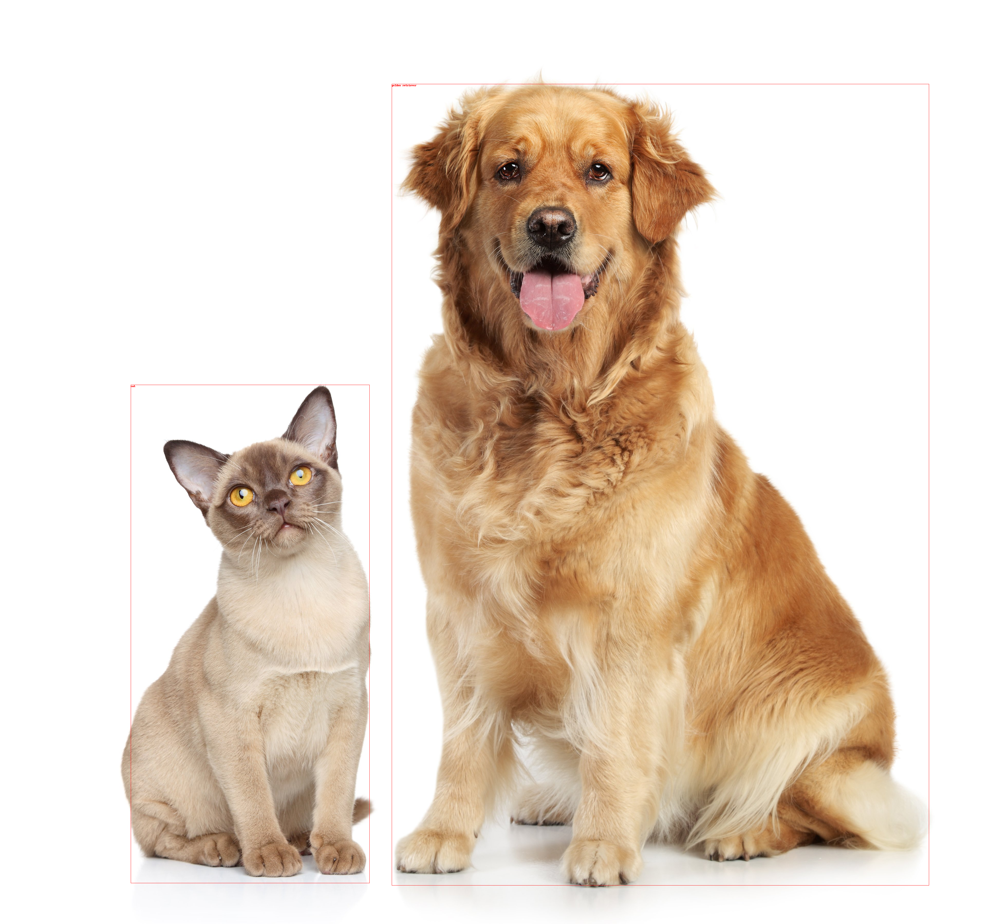

In [52]:
image

In [53]:
ocr_endpoint = endpoint + 'ocr'

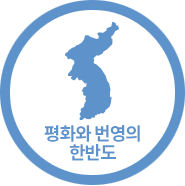

In [54]:
image_url = "https://www.unikorea.go.kr/unikorea/common/images/content/peace.png"

image = Image.open(BytesIO(requests.get(image_url).content))

image

In [55]:
headers = {'Ocp-Apim-Subscription-Key':key}
params = {'language':'ko','detectOrientation':'true'} #unk를 쓰면 auto detect가 된다.
data = {'url':image_url}

In [57]:
response = requests.post(ocr_endpoint, headers=headers, params=params, json=data)

result = response.json()
result

{'language': 'ko',
 'textAngle': 0.0,
 'orientation': 'Up',
 'regions': [{'boundingBox': '45,125,95,36',
   'lines': [{'boundingBox': '45,125,95,17',
     'words': [{'boundingBox': '45,125,46,17', 'text': '평화와'},
      {'boundingBox': '95,125,45,17', 'text': '번영의'}]},
    {'boundingBox': '70,144,46,17',
     'words': [{'boundingBox': '70,144,46,17', 'text': '한반도'}]}]}]}